<div style="font-family:Georgia; font-size:2.5vw; color:lightblue; font-weight:normal; text-align:center; background:url('./Animations/Title Background.gif') no-repeat center; background-size:cover)">
<br><br>
Oriented FAST and Rotated BRIEF (ORB)
<br><br><br>
</div>

# Introduction

One of the most challengable problem in Computer Vision is an **object detection**.<br>
Object detection is an ablitity to **recognise an objects in image** and being able to determine the objects location within the images.  <br>
For example, we want not just count how many cars are in image, but **where they are located**.
<br>
<figure>
  <img src = "./Animations/cars.jpg" width = 80% style = "border: thin silver solid; padding: 10px">
      <figcaption style = "text-align: center; font-style: italic">Fig1. - Car Detection.</figcaption>
</figure> 
<br>
In order to perform this object-based image analysis, we will use ORB. ORB is a very fast algorithm that creates feature vectors from detected keypoints. You've learned that ORB has some great properties, such as being invariant to rotations, changes in illumination, and noise. 

In this notebook, we will see these properties in action and implement the **ORB algorithm to detect a person’s face in an image using facial keypoints.**  

### Libraries import 

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import copy

%matplotlib inline 

In this notebook we will work with open-cv library and use this **to detect face on image using facial keypoint**.<br>
We are going to load **woman's face image** to use this as **training image**.<br>
As usually, we are going to convert BGR image to RGB to display this and then, convert to **grayscale for analysis**.

Note, we are going to use `plt.rcParams['figure.figsize']` to define figure size.

Text(0.5, 1.0, 'Grayscale Training image')

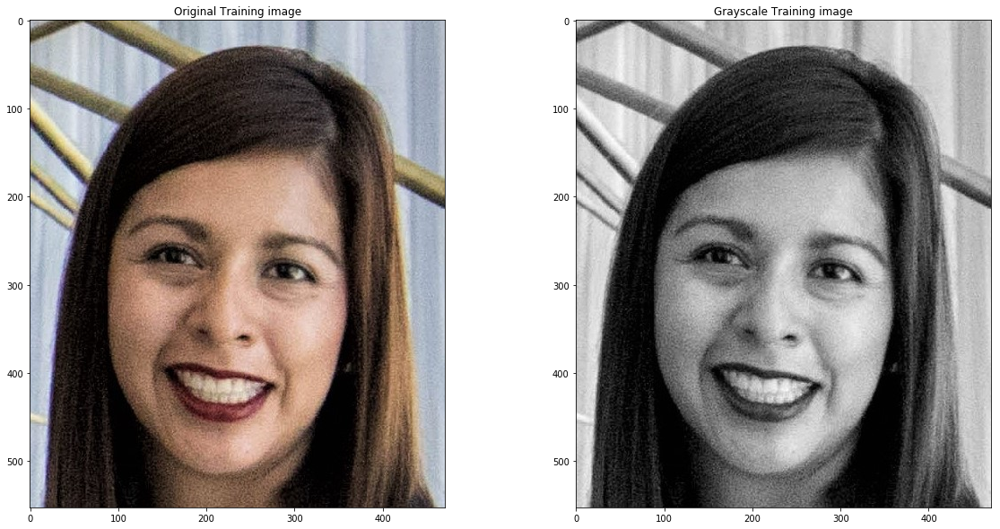

In [2]:
# define an image size 
plt.rcParams['figure.figsize'] = [20,10]
image = cv2.imread('images/face.jpeg')

# convert from BGR to RGB and assign to training image 
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# convert to grayscale for analysis 
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)

# plot training image against grayscale training image 

plt.subplot(121)
plt.imshow(training_image)
plt.title('Original Training image')

plt.subplot(122)
plt.imshow(training_gray, cmap='gray')
plt.title('Grayscale Training image')

### Locating keypoints

First step of ORB algorithm is to **locate the keypoints in training image**.<br>
Then, ORB algorithm creates corresponding feature vectors for all keypoints in training image and **groups them together into ORB descriptor**.

We will use open-cv `ORB` class to locate keypoints and create corresponding ORB descriptor.<br>
The parameters of ORB are set up using `ORB_create()`, that inputs following params:
- **nfeatures** - *int* <br>

Determines the maximum number of features (keypoints) to locate.
- **scaleFactor** - *float* <br>

Pyramid decimation ratio, must be greater than 1. ORB uses an image pyramid to find features, therefore you must provide the scale factor between each layer in the pyramid and the number of levels the pyramid has. 
A `scaleFactor = 2` - **factor of 2** means the classical pyramid, where each next level has **4x less pixels than the previous**. A big scale factor will **diminish (make less) the number of features found**.

- **nlevels** - *int*

The number of pyramid levels. The smallest level will have a linear size equal to input_image_linear_size/pow(scaleFactor, nlevels).

- **edgeThreshold** - *int*

Since **keypoints have their own specific pixel sizes**, the **edges** of the image **must be excluded from the search**. 
search. The size of the `edgeThreshold` should be **equal to or greater** than the `patchSize` parameter.

- **firstLevel** - *int*

Which level should be the **first level of the pyramid**.
It should be 0 in the current implementation. Usually, the pyramid level with a scale of unity is considered the first level.

- **WTA_K** - *int*

How many **random pixels we will compare** in terms of brightness (intensity) while performing **BRIEF algorithm**.<br> 
It will return the index of brightness - index of the **brightest pixel**.

The number of random pixels used to produce each element of the oriented BRIEF descriptor. <br>
The possible **values are 2, 3, and 4**, with 2 being the default value. <br>
For example, a value of 3 means three random pixels are chosen at a time to compare their brightness. The index of the brightest pixel is returned. Since there are 3 pixels, the returned **index will be either 0, 1, or 2**.

- **scopeType** - *int*

This parameter can be set to either **HARRIS_SCORE or FAST_SCORE**.<br>
The default HARRIS_SCORE means that the **Harris corner algorithm is used to rank features**. The score is used to only **retain the best features**. <br>
The FAST_SCORE produces slightly less stable keypoints, but it is a little faster to compute.

- **patchSize** - *int*
**Size of the patch used by the oriented BRIEF descriptor**.<br>

Of course, on smaller pyramid layers the perceived image area covered by a feature will be larger. The smaller the pyramid layer, the bigger the area of patch will be. 

Note, that **main params**, that we are most likely to change `nfeatures` and `scaleFactor`.<br>
The rest of parameters we can **leave default** and safely reach good results. 

Example of code can be following: <br>

`cv2.ORB_create(nfeatures = 500,
               scaleFactor = 1.2,
		       nlevels = 8,
		       edgeThreshold = 31,
		       firstLevel = 0,
		       WTA_K = 2,
		       scoreType = HARRIS_SCORE,
		       patchSize = 31,
		       fastThreshold = 20)`
    

In the code below, we will use the `ORB_create()`function to set the maximum number of keypoints we want to detect to 200, and to set the pyramid decimation ratio to 2.0. <br>
We will then use the ` .detectAndCompute(image)`method to locate the keypoints in the given training `image`and to compute their corresponding ORB descriptor. <br>
The **output**: **keypoints, descriptor**. 

Finally, we will use the `cv2.drawKeypoints()` function to visualize the keypoints found by the ORB algorithm. <br>
Parameters of `cv2.drawKeypoints()`:
 - **image** - source image (original);
 - **keypoint** - keypoints from soure image;
 - **outImage** -  its content depends on the flags value defining what is drawn in the output image. See possible flags bit values below.
 - **color** - Color of keypoints;
 - **flags** - settings of drawing features. Plausible flags bit values are defined by `DrawMatchesFlags`.

In [3]:
# import copy to make copy of training image 
import copy 

# set up the figure size 
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# then, we create an ORB class and pass main params:
# maximum number of keypoints to locate on training image and decimation ratio of pyramid 
# (how much we going to decrease each level)

orb = cv2.ORB_create(nfeatures = 200, scaleFactor = 2.0)

# next, we detect and compute keypoints and combine them into descriptor
# IMPORTANT: we will find keypoints on the grayscale image
# None param is specified if we do not want to use a mask 

keypoints, descriptor = orb.detectAndCompute(training_gray, None)

# next, let's create copies of training images to draw keypoints on them 

keyp_with_size = copy.copy(training_image)
keyp_without_size = copy.copy(training_image)

Next, let's **draw keypoints in two ways** on created copies of images:
- **without** size and orientation (using BRIEF);
- **with** size and orientation (using rBRIEF). 

Then, we can **visualize versions of keypoints locations** side-by-side. <br>
Additionally, let's display the **number of keypoints**, that we have detected. 

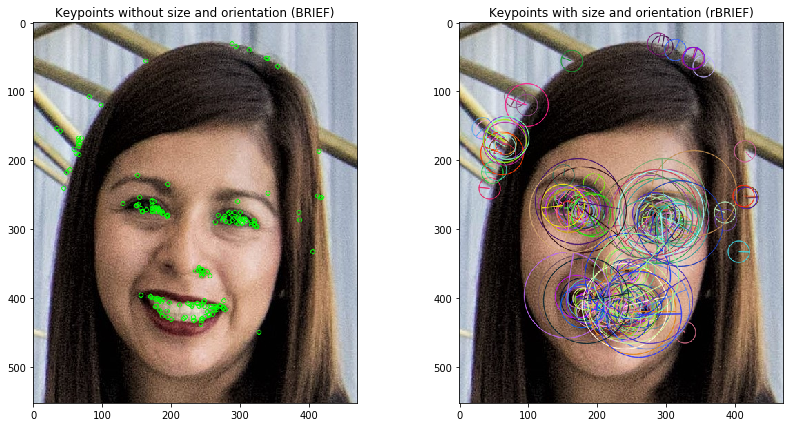


Number of keypoints detected: 175


In [4]:
# start with drawing keypoints without size and orientation
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color = (0, 255, 0))
# continue with keypoints with size and orientation  
cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display results side by side on copies of training images 

plt.subplot(121)
plt.imshow(keyp_without_size)
plt.title('Keypoints without size and orientation (BRIEF)')

plt.subplot(122)
plt.imshow(keyp_with_size)
plt.title('Keypoints with size and orientation (rBRIEF)')
# not forget to add plt.show() to display the whole picture
plt.show()

print('\nNumber of keypoints detected:', len(keypoints))

We can see, that on the keypoints on the right image are **located according to the center, size and angle** (so, they have center, size and angle).<br>

 1) **Center** determines the location of each keypoint in image;<br>
 2) **Size** is determined by patch size, used by BRIEF to create it's feature vector;<br>
 3) **Angle** tells us about **orientation of keypoint** and determined by **rBRIEF** algorithm. 

Once we calculated feature vectors for all keypoints and formed into descriptor for training image, we can perfrom the same procedure with ORB algorithm for **query image**.<br>
In order to see the priorities of ORB more clearly,  in the next sections we will use the same image as our **training and query  image**. 

### Feature Matching 

Once we calculated descriptors for **both training and query images**, the final step is to perform **keypoints matching between two images**,  using their corresponding **ORB descriptors**.<br>
Matching is performed by **Matching function** and one of the most common function is **Brute-Force** matching. 

In our code we will use open-cv `BFMatcher` to compare keypoints in query and training images.<br>
Params of Brute-Force matcher are set up with `cv2.BFMatcher()` function. The parameters of function and its default values are represented below: 

`cv2.BFMatcher(normType = cv2.NORM_L2,
               crossCheck = False)`


Parameters:

* **normType**  
Specifies the **metric used to determine the quality of the match**.<br> 
Recall, we mentioned **Euclidean distance between two descriptors** as possible choice. 
By default, `normType = cv2.NORM_L2`, which measures the distance between two descriptors. <br>
However, for **binary descriptors** like the ones created by ORB, the **Hamming metric is more suitable**.<br>
The Hamming metric determines the distance by counting the number of **dissimilar bits between the binary descriptors**. <br>
When the ORB descriptor is created using `WTA_K = 2` (the one we created previously using `cv2.ORB_create()`), **two random pixels are chosen and compared in brightness**.<br>
**Recall**: the procedure of choosing pair of pixels from Gaussian distribution is performed by **BRIEF** algorithm.

The index of the brightest pixel is returned as **either 0 or 1**. So, our basic set up for ORB lagorithm. <br>
**IMPORTANT**: Such output only occupies **1 bit**, and therefore the ` cv2.NORM_HAMMING` metric should be used!<br>

If, on the other hand, the ORB descriptor is created using `WTA_K = 3`, **three random pixels are chosen and compared in brightness**.<br>
The index of the brightest pixel is returned as **either 0, 1, or 2**.  Such output will **occupy 2 bits**, and therefore a **special variant of the Hamming distance**, known as the `cv2.NORM_HAMMING2` (the **2** stands for **2 bits**), should be used instead. Then, for any metric chosen, when comparing the keypoints in the training and query images, the **pair with the smaller metric (distance between them)** is considered the best match.<br>

Simply saying, the **smaller the distance** thew **bigger is similarity between descriptors**.


* **crossCheck** - *bool* 
A Boolean variable and can be set to either `True` or `False`. Cross-checking is very useful for **eliminating false matches**.<br>
Cross-checking works by **performing the matching procedure two times**.<br>

1) The **first time** the keypoints in the training image are compared to those in the query image; <br>
2) The **second time**, however, the keypoints in the query image are compared to those in the training image (*i.e.* the **comparison is done backwards**).<br>

When cross-checking is enabled a ***match is considered valid only if keypoint *A* in the training image is the best match of keypoint *B* in the query image and vice-versa** (that is, if keypoint *B* in the query image is the best match of point *A* in the training image). 

Once the parameters of the *BFMatcher* have been set, we can use the `.match(descriptors_train, descriptors_query)` method to **find the matching  keypoints between the training and query images using their ORB descriptors**.<br>

Basically, first, we set up the parameters of `BFMatcher`, then we **perform matching itself**, using chosen parameters. We pass **two descriptors** - `descriptors_train` and `descriptors_query` into `.match()` function. 

Finally, we will use the ` cv2.drawMatches ()` function to **visualize the matching keypoints found by the Brute-Force matcher**.<br>
This function **stacks the training and query images horizontally** and **draws lines from the keypoints in the training image to their corresponding best matching keypoints in the query image**.<br>
Thus, we stack images horizontally and connect their keypoints via lines. 
Remember that in order to see the properties of the ORB algorithm more clearly, in the following examples we will use the same image as our training and query image.    

In [11]:
matches

[<DMatch 0x12021bd70>,
 <DMatch 0x12021be90>,
 <DMatch 0x12021be70>,
 <DMatch 0x12021be50>,
 <DMatch 0x107fc5d90>,
 <DMatch 0x11efb8cb0>,
 <DMatch 0x120796bb0>,
 <DMatch 0x120796b70>,
 <DMatch 0x1202281f0>,
 <DMatch 0x120228290>,
 <DMatch 0x120228270>,
 <DMatch 0x120228250>,
 <DMatch 0x1202282b0>,
 <DMatch 0x1202282d0>,
 <DMatch 0x1202282f0>,
 <DMatch 0x120228310>,
 <DMatch 0x120228330>,
 <DMatch 0x120228350>,
 <DMatch 0x120228370>,
 <DMatch 0x120228390>,
 <DMatch 0x1202283b0>,
 <DMatch 0x1202283d0>,
 <DMatch 0x1202283f0>,
 <DMatch 0x120228410>,
 <DMatch 0x120228430>,
 <DMatch 0x120228450>,
 <DMatch 0x120228470>,
 <DMatch 0x120228490>,
 <DMatch 0x1202284b0>,
 <DMatch 0x1202284d0>,
 <DMatch 0x1202284f0>,
 <DMatch 0x120228510>,
 <DMatch 0x120228530>,
 <DMatch 0x120228550>,
 <DMatch 0x120228570>,
 <DMatch 0x120228590>,
 <DMatch 0x1202285b0>,
 <DMatch 0x1202285d0>,
 <DMatch 0x1202285f0>,
 <DMatch 0x120228610>,
 <DMatch 0x120228630>,
 <DMatch 0x120228650>,
 <DMatch 0x120228670>,
 <DMatch 0x

First of all, let's set up the figure size and load image, that we will use as **training and query image at the same time**. <br>
Display images side-by-side for sanity check. 

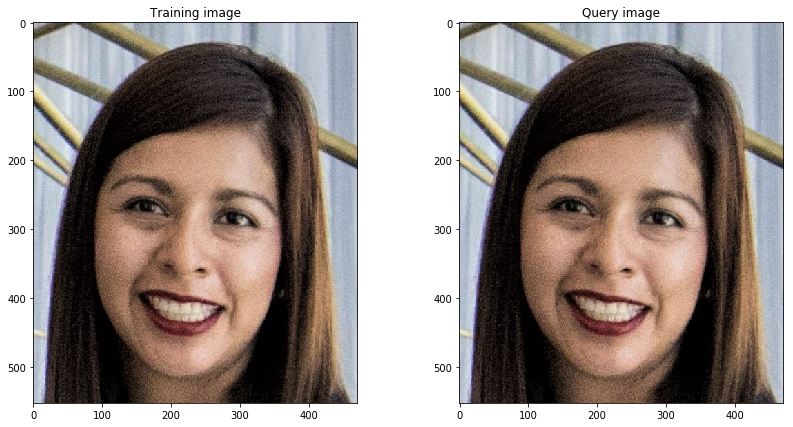

In [8]:
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# load the training image
image_1 = cv2.imread('images/face.jpeg')
# load the query image - same as training 
image_2 = cv2.imread('images/face.jpeg')

# convert training and query image from BGR to RGB 
training_image = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

plt.subplot(121)
plt.imshow(training_image)
plt.title('Training image')

plt.subplot(122)
plt.imshow(query_image)
plt.title('Query image')

plt.show()

Next, let's convert images to grayscale and:

1) Apply **ORB** lagorithm for both training and query images as we did previously;<br>
2) Perform **Feature-Matching using Brute-Force algorithm**. 


In [24]:
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)

# let's use 1000 keypoints as a maximum value to locate using ORB
# and decimation ratio = 2.0
orb = cv2.ORB_create(nfeatures = 1000,
                    scaleFactor = 2.0)

# next, we will retrieve the keypoints and descriptors for both images 
# Note, the None stands for non-mask usage
keypoints_train, descriptoir_train = orb.detectAndCompute(training_gray, None) 
keypoints_query, descriptoir_query = orb.detectAndCompute(query_gray, None) 

# next, we will create Brute-Force Matcher and specify the parameters 
# set cross-check to True in order to return only consistent matched pairs
# when there are enough matches, this technique produces best results with minimal number of outliers
# since it returns only proper matched pairs using 2-steps check procedure 

# plus, since we are going to compare 2 pixels, drawn from Gaussian distribution,
# the procudure will occupy 1-bit result per each comparison and we can use. cv2.NORM_HAMMING for this 

bf = cv2.BFMatcher(
    normType = cv2.NORM_HAMMING,
    crossCheck = True
)

# then, we can match 2 descriptors for both training and query images 

matches = bf.match(descriptoir_train, descriptoir_query)

Next, we need to **sort the matches according to the distance** - we need the shorter distance and, therefore, **most similar keypoints**. <br>
Note, that `bf.match()` returns the list of matches, that have a **.distance** attribute. 

In [22]:
for match in matches:
    print(match.distance)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [23]:
# create custom sort function according to the distance 
# specify "key" argument as  "lambda function"

matches = sorted(matches, key = lambda x: x.distance)

Now, we can connect the **best matched pairs of keypoints** and display them using `cv2.drawMatches()` function.<br>
Since, we sorted the list of matches, **the best matches with the shortest distance** will correspond to **first elements in matches list**. 
<br>
Let's draw **first 300 keypoints** and use `flag = 2`to display keypoints **without size and orientation**. 

Parmeters of `cv2.drawMatches()` are:

 - **training grayscale image**;
 - **training keypoints**;
 - **query grayscale image**:
 - **query keypoints**;
 - **matches list**;
 - **outImg** - we will use grayscale query image as output image;
 - **flags**. 

In [26]:
results = cv2.drawMatches(training_gray, keypoints_train,
                          query_gray, keypoints_query,
                         matches[:300],
                         query_gray, flags = 2)

Finally, let's visualize resulted image and additionally display algorithm's outputs:

 - number of keypoints in **training image**;
 - number of keypoints in **query image**;
 - number of **matched keypoints between training and query** images.

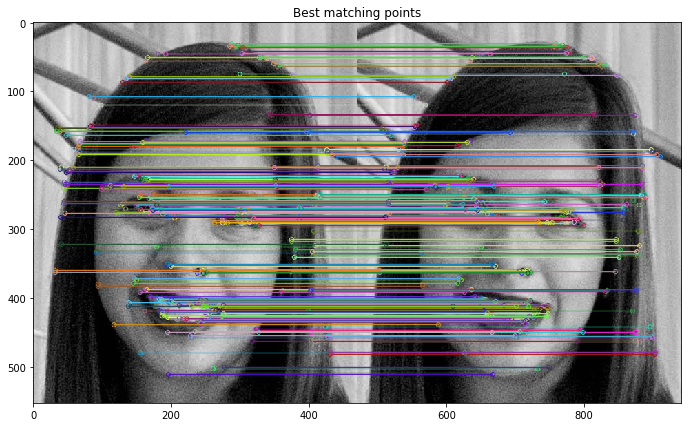

Number of keypoints in Training image: 819
Number of keypoints in Query image: 819

Number of Matched keypoints between Training and Query images: 819


In [28]:
# display matching points 
plt.imshow(results)
plt.title('Best matching points')
plt.show()

print('Number of keypoints in Training image:', len(keypoints_train))
print('Number of keypoints in Query image:', len(keypoints_query))
print('\nNumber of Matched keypoints between Training and Query images:', len(matches))

As expected, **ORB algorithm** found the same number of keypoints for **both Training and Query images**. <br>
As well, we see, that **Brute-Force correctly matched all keypoints** between training and query images. 

## ORB's Main Properties

Now, we are ready to explore each property of ORB algorithm:

 - Scale invariance;
 - Rotation invariance;
 - Illumination invariance;
 - Niose invariance.
 
We can say, that **ORB algoritm's result does not vary** depending on conditions above and we can **detect objects regardless of them**. <br>
As previously, let's use the **same image for training and query images**. 

### Scale Invariance

In this part we will illustarte the invariance of ORB algorithm to image scaling.<br>
Note, we will not change the code here, but will use **query image, that is a size of ¼ of original training image**.

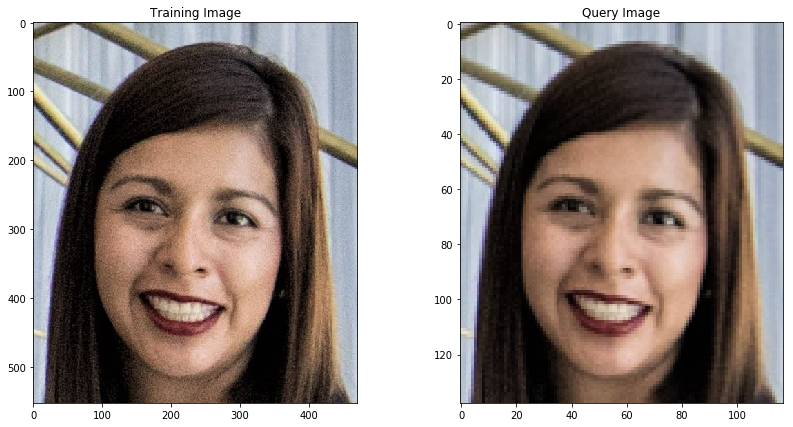

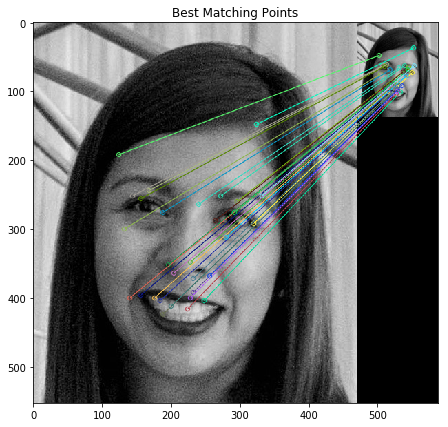


The Training Image has shape: (553, 471)
The Query Image has shape: (138, 117)

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  65

Number of Matching Keypoints Between The Training and Query Images:  58


In [29]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('images/face.jpeg')

# Load the query image
image2 = cv2.imread('images/faceQS.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 30 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:30], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the shape of the training image
print('\nThe Training Image has shape:', training_gray.shape)

#Print the shape of the query image
print('The Query Image has shape:', query_gray.shape)

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

From the results above, we can conlude, that ORB **detected much smaller number of keypoints in Query image**:<br>
**65 in query image vs 821 in training image** because of the smaller size of query image (138 x 117 pixels in query comared to 553 x 471 pixels in training).<br>

Nevertheless, algorithm managed to **match majority of keypoints in training image to corresponding keypoints in query image** (58 points out of 65). 

### Rotation Invariance

Moreover, ORB algorithm is invariant to rotation, that means we can **detect objects in images regardless of their orientation**.<br>
To demonstrate this, we will use query image, that has been **rotated by 90 degrees**. <br>
Let's find **matching keypoints between this query image and training image**. 

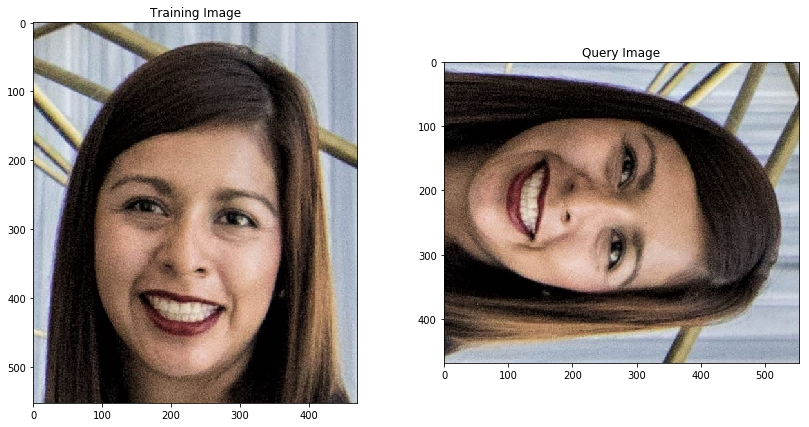

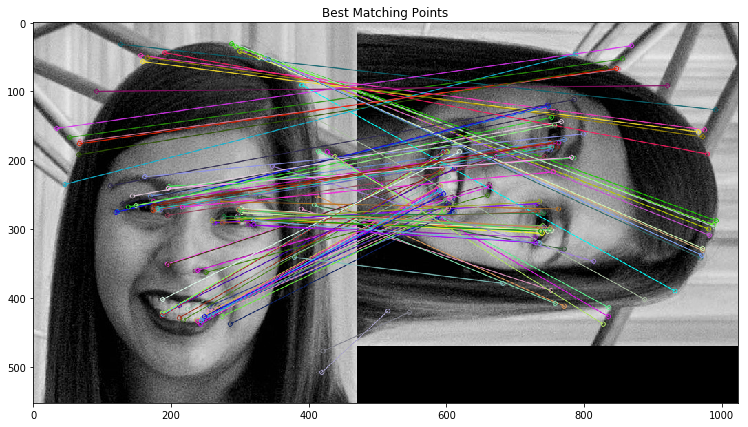


Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  832

Number of Matching Keypoints Between The Training and Query Images:  616


In [30]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/faceR.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Regardless of rotation, our algorithm, using Brute-Force method **found majority (616) of matching keypoints**.<br>
Note, that most of them are actually **close to particular facial features** (mouth, nose, eyes and etc.)

### Illumination Invariance

Next property, that we want to present is **Illumination Invariance**, that means the ability to detect an object **regardless of it illumination (light condition - darker/brighter color)**.<br>
For this purpose we will look at the **query image, that is much brighter** than the training image.

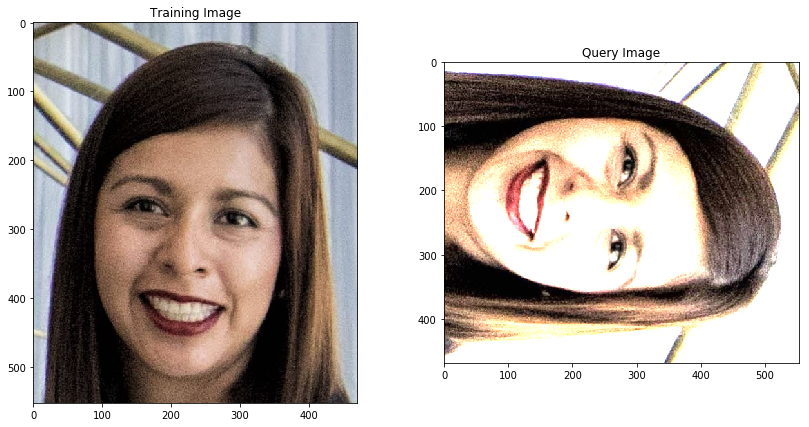

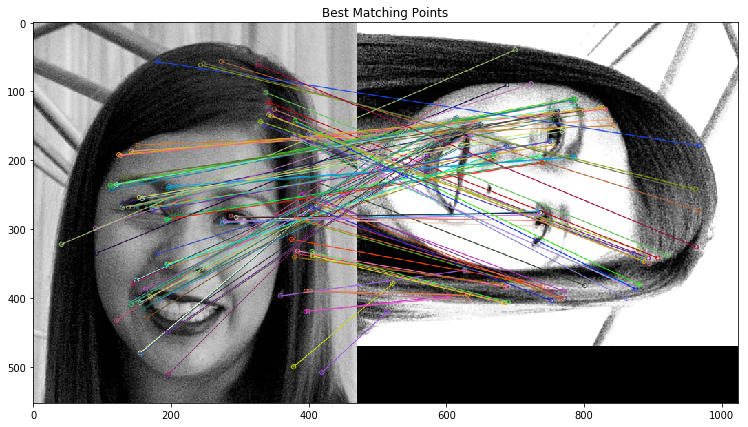


Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  846

Number of Matching Keypoints Between The Training and Query Images:  390


In [32]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('images/face.jpeg')

# Load the query image
image2 = cv2.imread('images/faceRI.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("\nNumber of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Even if the query image is much brighter, Brute-Force algorithm is **still able to detect large number of matching keypoints.**

### Noise Invariance

The last property is **Noise Invariance** - ability to detect the objects even if the **image has some degree of noise**.  <br>
To demonstrate this, let's apply Brute-Force algorithm on **query image, that has a lot of noise**. 

As well, we can **change one parameter** - **dicimation ratio** of images on each level in pyramid to produce better results. <br>
Change this from **2.0 to 1.3**.

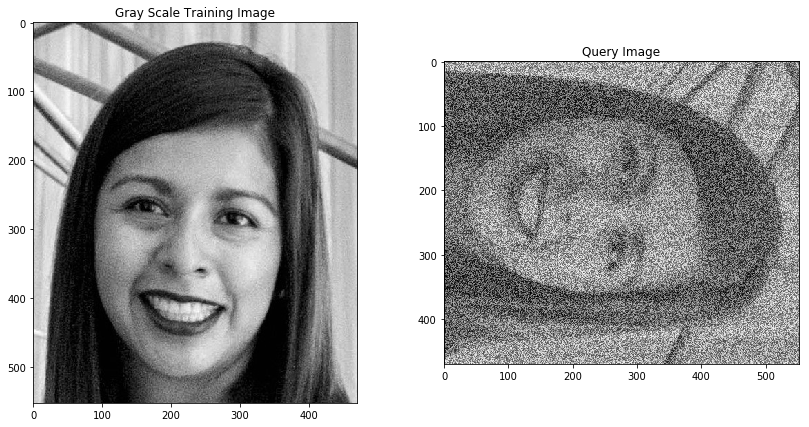

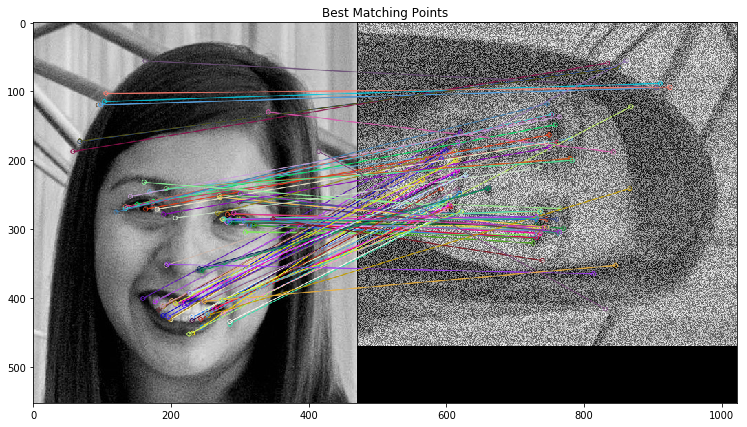

Number of Keypoints Detected In The Training Image:  903
Number of Keypoints Detected In The Query Image:  925

Number of Matching Keypoints Between The Training and Query Images:  257


In [33]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('images/face.jpeg')

# Load the noisy, gray scale query image. 
image2 = cv2.imread('images/faceRN5.png')

# Convert the query image to gray scale
query_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Convert the training image to gray scale
training_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# Display the images
plt.subplot(121)
plt.imshow(training_gray, cmap = 'gray')
plt.title('Gray Scale Training Image')
plt.subplot(122)
plt.imshow(query_gray, cmap = 'gray')
plt.title('Query Image')
plt.show()

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(1000, 1.3)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case. 
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. We set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 100 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:100], query_gray, flags = 2)

# we display the image
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

In this example, the algorithm is still able to detect keypoints even on highly noised image.<br>
Again, it seems, that Brute-Force found matched keypoints between images, that are **close to particular facial features**.<br>

Note, we have some features, that don't quite match up, but they may have been chosen because of the **similar pattern of inensity in particular areas of image.** <br>
So, it's possible, that some keypoints may be chosen because of **similarity of intensity patterns** between query and training images.

## Object Detection

Now, considering the properties, described above, we can apply ORB algorithm with Brute-Force matching on **object detection problem**.<br>
Let's **detect face in multi-faces image**. <br>
In this case, **training image** image with face and **query image** - image with multiple faces.<br>
Let's apply the same code and visualize the results.

### Step 1: Training and Query images loading

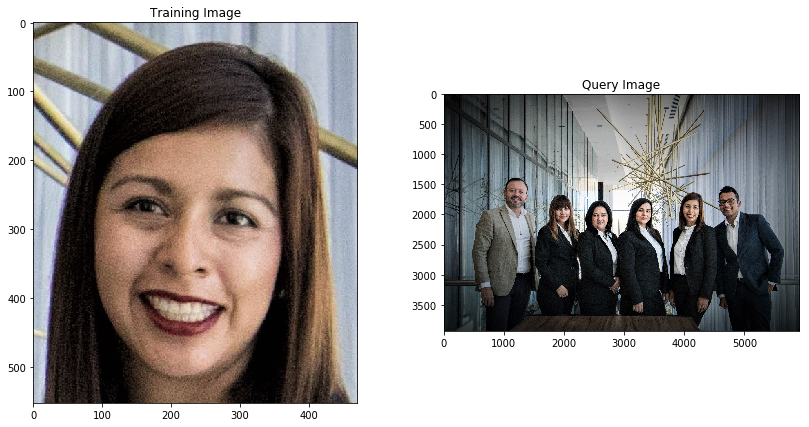

In [4]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('images/face.jpeg')

# Load the query image
image2 = cv2.imread('images/Team.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the images
plt.subplot(121)
plt.imshow(training_image)
plt.title('Training Image')
plt.subplot(122)
plt.imshow(query_image)
plt.title('Query Image')
plt.show()

On the one hand, based on previous algorithm's output, we know, the majority of keypoints are **located near facial features**, on the other hand - there are multiple woman's faces in the image, so, **algorithm needs to detect the one in training image**. 

### Step 2: Drawing keypoints on Query image (with size and orientation)

Now, we are ready to **detect and draw keypoints on Query image**. 

One note: since **we care about size and orientation of keypoints**, we will use `flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS` in `cv2.drawKeypoints()`.

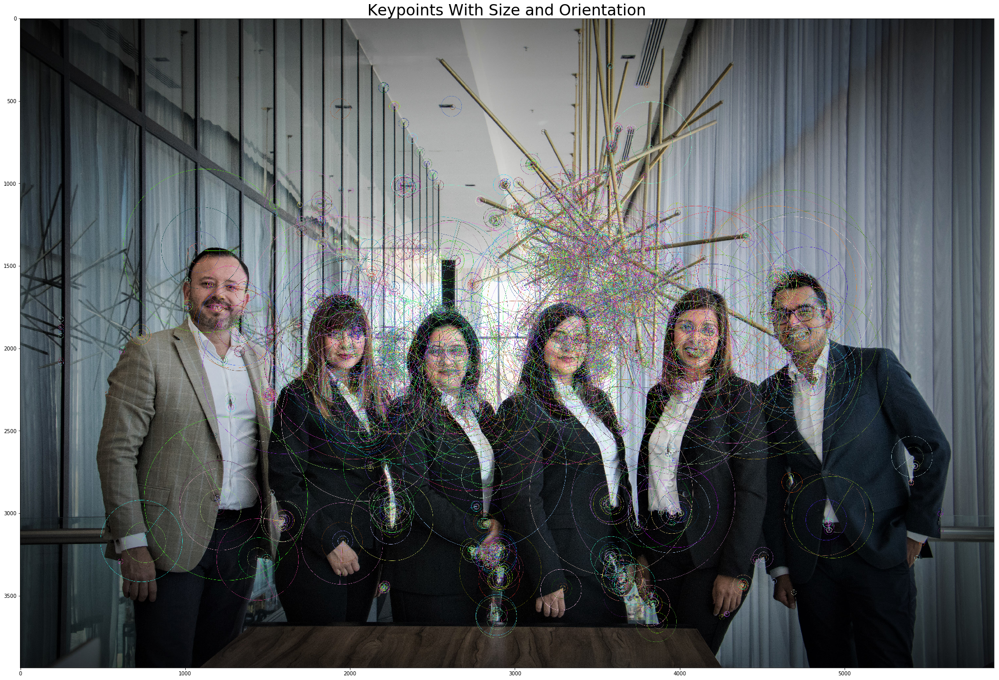


Number of keypoints Detected:  4941


In [8]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(5000, 2.0)

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.  
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create copies of the query images to draw our keypoints on
query_img_keyp = copy.copy(query_image)

# Draw the keypoints with size and orientation on the copy of the query image
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the query image with the keypoints with size and orientation
plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints_query))

As we see above - **algorithm has detected keypoonts over entire image, considering size and orientation**.<br>

### Step 3: Keypoints matching

But now we have keypoints in training image, hence we are ready to **match them with keypoints in query image** and detect woman's face in query image. <br>
Let's display **85 best matched pairs of keypoints** (accoring to the distance between each other). 

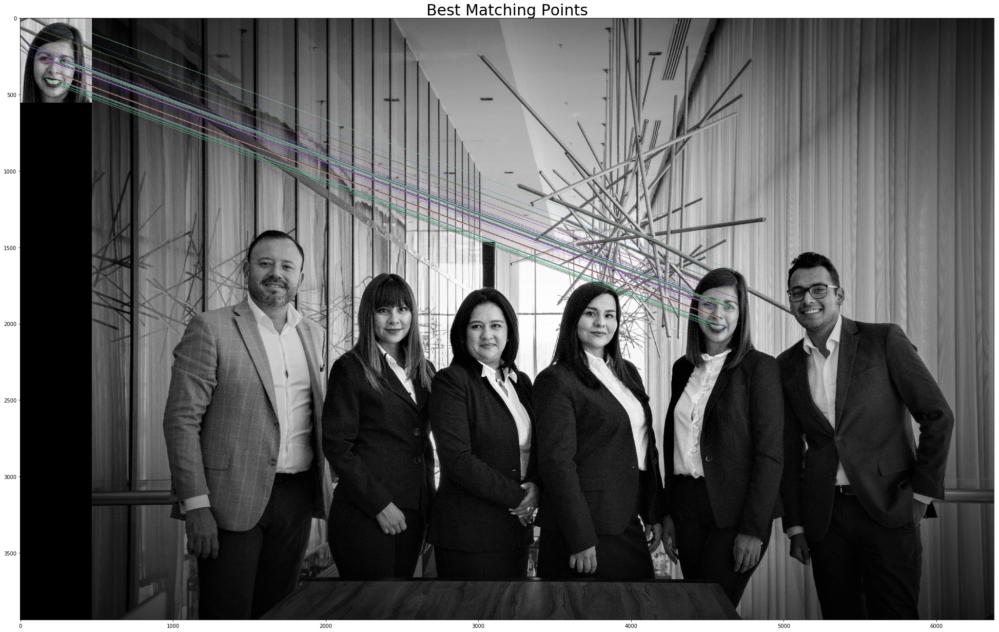

Number of Keypoints Detected In The Training Image:  2488
Number of Keypoints Detected In The Query Image:  4941

Number of Matching Keypoints Between The Training and Query Images:  669


In [10]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Create a Brute Force Matcher object. We set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 85 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:85], query_gray, flags = 2)

# we display the image
plt.title('Best Matching Points', fontsize = 30)
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

We can see, that even though there are many faces in query image, **Brute-Force matcher is still able to correctly locate the training image's face in query image**.